# Calibration frames

**Prerequisites**
- Basic statistics (covered in [this notebook](./basic_stat.ipynb))
- Knowledge about CCD, bias, dark, and flat frames.

**We will learn**
- What do bias, dark, and flat frames look like
- How to deal with outliers; sigma-clipping.
- How to combine individual calibration frames to make "master" calibration frames.
- Further familiarize with operations on numpy arrays and data I/O.

**Reference**
- [Here](https://www.astropy.org/ccd-reduction-and-photometry-guide/v/dev/notebooks/01-01-astronomical-CCD-image-components.html) is a **great** tutorial on CCD data reduction. Please check out!!
- Howell, S., Handbook of CCD Astronomy, Second Ed, Cambridge University Press 2006

``I suppose Jenny already introduced bias, dark, flat frames. Here I will demonstrate what real bias frames look like, and why we need to stack them.``

In [1]:
%load_ext autoreload
%autoreload 2

import os, sys
import numpy as np
import scipy
import matplotlib
import matplotlib.pyplot as plt

# We can beautify our plots by changing the matpltlib setting a little
plt.rcParams['font.size'] = 18
plt.rcParams['figure.figsize'] = (8, 6)
plt.rcParams['figure.dpi'] = 80
plt.rcParams['axes.linewidth'] = 2

In [2]:
try:
    import google.colab
    IN_COLAB = True
except:
    IN_COLAB = False

if not IN_COLAB:
    if not os.path.exists("../_static/ObsAstroData/calibration_frames/bias/"):
        os.makedirs("../_static/ObsAstroData/calibration_frames/bias/")
    os.chdir('../_static/ObsAstroData/calibration_frames/')

if os.path.isfile('b0860c1.fits'):
    print('Data is already there')
else:
    print('Download data')
#     !wget https://tigress-web.princeton.edu/~jiaxuanl/cutoutRGB_NIRCAM.pkl

Download data


# 1. Bias frames

As introduced in class, a voltage is applied to every pixel to make sure the pixel value is always positive. This voltage introduces a "bias" to pixel values. However, this bias is slightly different for each pixel and might change over time. Therefore, we need to take some zero-time exposures (such that dark current and real photons don't contribute to the pixel values) to characterize the bias. 

Below we load bias frames taken using the camera of IFU-M on the 6.5 m [Magellan telescope](https://en.wikipedia.org/wiki/Magellan_Telescopes) in Chile. 

## Read a bias frame

In [4]:
from astropy.io import fits

It's our first time reading a FITS file. FITS (Flexible Image Transport System) format is widely used in astronomy for images and tables. The following code will read the file `b0854c1.fits`, which is a list containing only one HDU (Header Data Unit). 

In [24]:
fits.open('./bias/b0860c1.fits')

```{margin}
`.info()` is quite helpful for understanding the structure of a FITS file. 
```

In [25]:
fits.open('./bias/b0860c1.fits').info()

Filename: ./bias/b0860c1.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     143   (2176, 1156)   int16 (rescales to uint16)   


Now we know that this file has one HDU, which is an image containing 2176 * 1156 pixels. The data type in `int16`. We can check the header of the HDU. 

In [30]:
hdu = fits.open('./bias/b0860c1.fits')[0]
hdu.header

SIMPLE  =                    T                                                  
BITPIX  =                   16                                                  
NAXIS   =                    2                                                  
NAXIS1  =                 2176                                                  
NAXIS2  =                 1156                                                  
BSCALE  =           1.00000000         / real=bzero+bscale*value                
BZERO   =       32768.00000000                                                  
BUNIT   = 'DU/PIXEL'                                                            
ORIGIN  = 'LCO/OCIW'                                                            
OBSERVER= 'Bailey'                     / observer name                          
TELESCOP= 'Clay'                       / telescope                              
SITENAME= 'LCO'                                                                 
SITEALT =                 24

Let's read the data array.

In [31]:
img = hdu.data
img

array([[817, 817, 817, ..., 816, 813, 819],
       [816, 818, 820, ..., 817, 818, 828],
       [809, 827, 817, ..., 812, 814, 816],
       ...,
       [813, 810, 815, ..., 814, 816, 823],
       [821, 818, 816, ..., 823, 820, 816],
       [812, 819, 815, ..., 819, 816, 814]], dtype=uint16)

In [32]:
np.median(img), np.std(img)

(817.0, 10.545205968480271)

The pixel values in this bias frame are centered around ~817, and have a dispersion of ~10.5. This dispersion is largely contributed by the read-out noise, a noise that added to each pixel when reading the charge out. Read-out noise may be viewed as a "toll" that must be paid for reading the stored charge.

In [11]:
np.sum(img < 0)

0

Thanks to the bias voltage, none of the pixels are negative. We can further visualize the bias frame as follows.

```{margin}
We provide a function `show_image` to help visualize astronomical images that typically have a large dynamical range. Please feel free to use it.
```

In [6]:
from utils import show_image

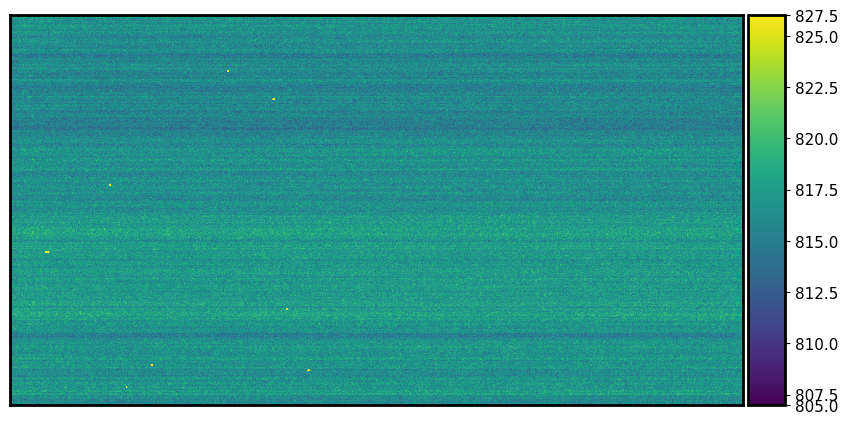

In [12]:
show_image(img, show_colorbar=True);

The bias frame shows some spatial patterns: some rows have a lower bias value than others. We also see some distinct "bright" pixels. They could be either bad pixels, or caused by Cosmic Rays (CR). As a consequence, when we plot the histogram of pixel values, we will see some outliers from the bulk of pixels.

```{margin}
This figure highlights the difference between linear (left) and logarithmic (right) scales when plotting histogram. The number of outliers is too small to be visible in the left histogram with a linear scale in the y-axis. Logarithmic scale comes to save us. When you encounter a dataset that spans a huge dynamical range, maybe you should consider using `log` scale. 
```

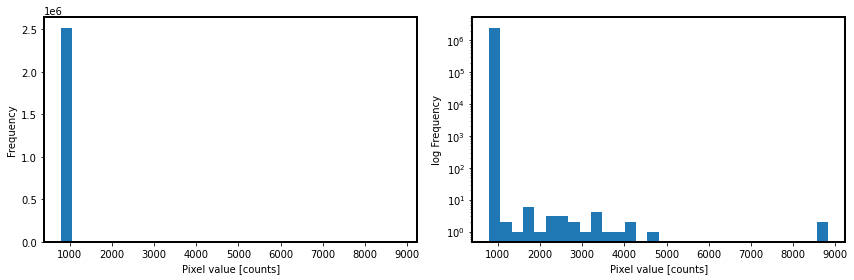

In [13]:
fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(12, 4))

ax1.hist(img.flatten(), bins=30)
ax1.set_xlabel('Pixel value [counts]')
ax1.set_ylabel('Frequency')
ax2.hist(img.flatten(), bins=30)
ax2.set_yscale('log')
ax2.set_xlabel('Pixel value [counts]')
ax2.set_ylabel('log Frequency')

plt.tight_layout()

During the Magellan observation, we took many bias frames (why??). So let's load another bias frame. What do you expect? Will it be very different from the one above?

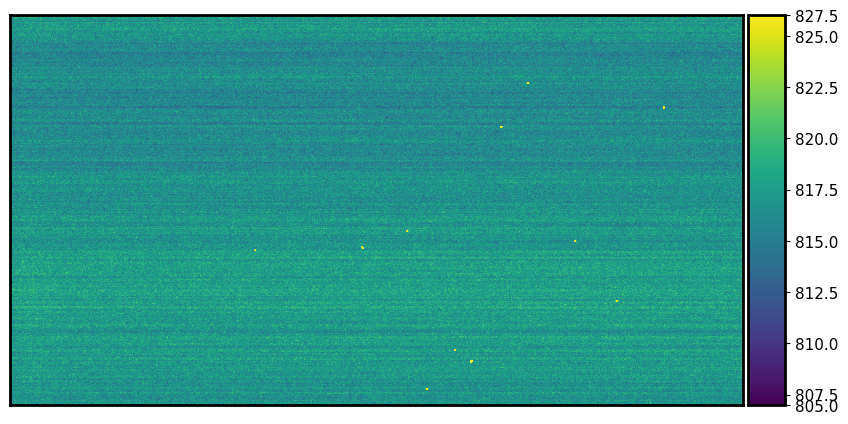

In [14]:
show_image(fits.open('./bias/b0861c1.fits')[0].data);

Yeah, the bright spots changed their positions in the image. So it does seem like they are caused by cosmic rays. 

## Combine bias frames to make "master" bias
We have already learned from [this notebook](./basic_stat.ipynb) that combining images will reduce the noise level. Belowe we try to combine 40 bias frames. 

```{margin}
Here I use ["Nested List Comprehensions"](https://docs.python.org/3/tutorial/datastructures.html) to construct a list. This is equivalent to the following snippet, but is much shorter.
```python
biases = []
for ind in range(860, 900):
    biases.append(fits.open(
        f'./b0{ind}c1.fits'
        )[0].data)
```
```

In [19]:
biases = [fits.open(f'./bias/b0{ind}c1.fits')[0].data for ind in range(860, 900)]
biases = np.array(biases)

In [20]:
biases.shape

(40, 1156, 2176)

In [21]:
# We have introduced how to calculate the mean and median image using the `axis` argument.
# Check `basic_stat.ipynb`
med_bias = np.median(biases, axis=0)
mean_bias = np.mean(biases, axis=0)

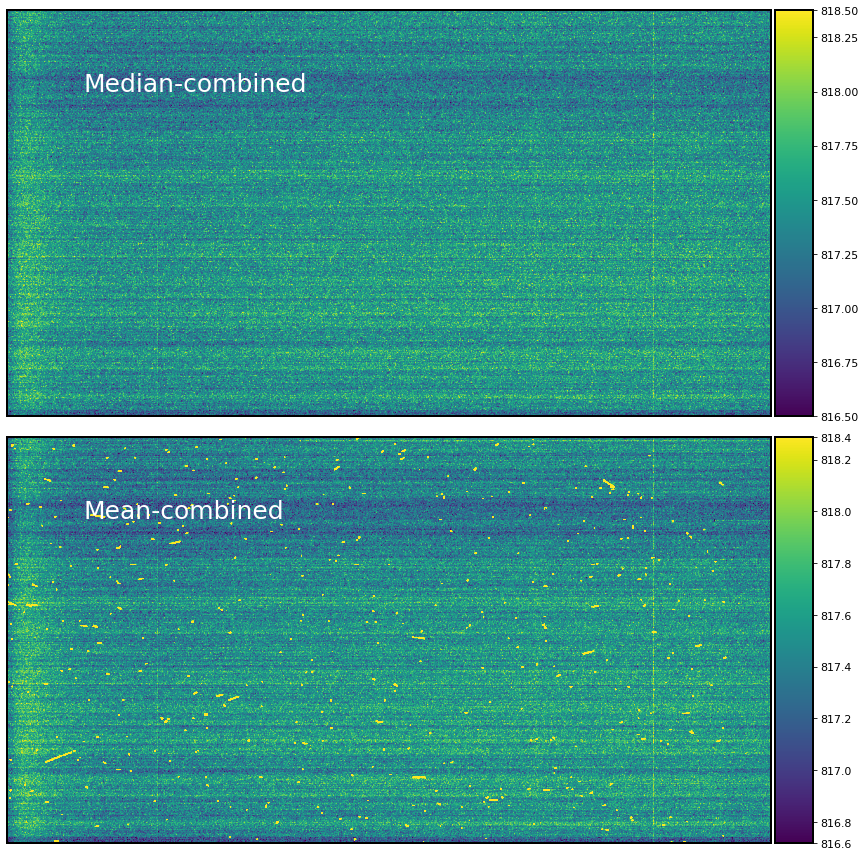

In [22]:
fig, [ax1, ax2] = plt.subplots(2, 1, figsize=(12, 12))

ax1 = show_image(med_bias, ax=ax1, fig=fig,)
ax1.text(0.1, 0.8, 'Median-combined', fontsize=25, color='w', 
         ha='left', transform=ax1.transAxes)

ax2 = show_image(mean_bias, ax=ax2, fig=fig,)
ax2.text(0.1, 0.8, 'Mean-combined', fontsize=25, color='w', 
         ha='left', transform=ax2.transAxes)

plt.tight_layout()

Wow! The cosmic rays are everywhere in the mean-combined image! The vast difference between the median-combined and mean-combined images highlights that the mean is far less immune to outliers (i.e., cosmic rays) than the median. Because of this, we often use median to combine images.

The histogram below shows again that combining individual bias frames will help reduce the read-out noise, thus boost the SNR. 

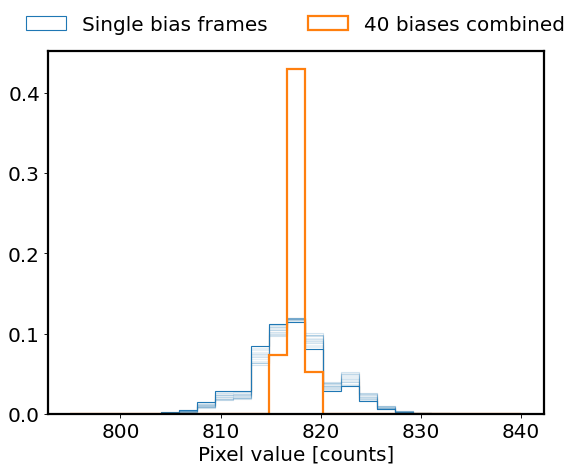

In [25]:
plt.hist(biases[0].flatten(), histtype='step', density=True, 
         range=(795, 840), bins=25, lw=1, label='Single bias frames')
for i in range(1, 21):
    plt.hist(biases[i].flatten(), histtype='step', density=True, 
         range=(795, 840), bins=25, alpha=0.1, color='C0')

plt.hist(med_bias.flatten(), histtype='step', density=True, 
         range=(795, 840), bins=25, lw=2, label='40 biases combined')

plt.xlabel('Pixel value [counts]')

plt.legend(loc='upper center', ncols=2, frameon=False, bbox_to_anchor=(0.5, 1.15));

## Sigma-clipping

In astronomy, there is yet another way to deal with outliers. 

Recall that for a Gaussian distribution, the probability for a data point being $>3\sigma$ away from the mean $\mu$ is very very slim. So if we see such a data point that is quite far from the center of the data set, it is probably an outlier and should be removed. This is the idea of **sigma clipping**. 

In the following, we flag out pixels that are $>3\sigma$ away from the median value (we don't use the mean value because it is heavily biased by these cosmic rays). You can see the cosmic rays being marked as red in the figure below (they are tiny dots).

In [26]:
hdu = fits.open('./bias/b0860c1.fits')[0]
img = hdu.data.astype(float)
med, std = np.median(img), np.std(img)
flag = (np.abs(img - med) > 3 * std)

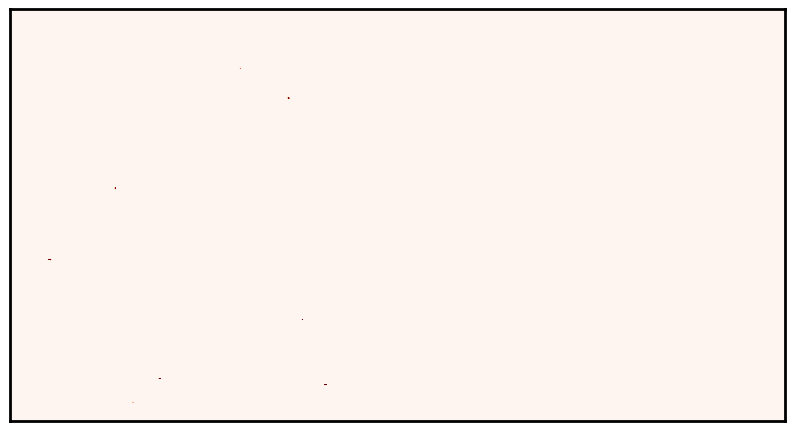

In [27]:
show_image(flag, cmap='Reds', vmin=0., vmax=0.2, show_colorbar=False);

We can replace these outlier pixels with `np.nan` (not a number, typically used to indicate a bad value). Then we repeat this for all 40 bias frames and combine them. 

In [7]:
# This might be slow
biases_clipped = []
for ind in range(860, 900):
    img = fits.open(f'./bias/b0{ind}c1.fits')[0].data.astype(float)
    med, std = np.median(img), np.std(img)
    flag = (np.abs(img - med) > 3 * std)
    img[flag] = np.nan
    biases_clipped.append(img)
biases_clipped = np.array(biases_clipped)

In [8]:
# might be slow
med_bias_clipped = np.nanmedian(biases_clipped, axis=0)
mean_bias_clipped = np.nanmean(biases_clipped, axis=0)

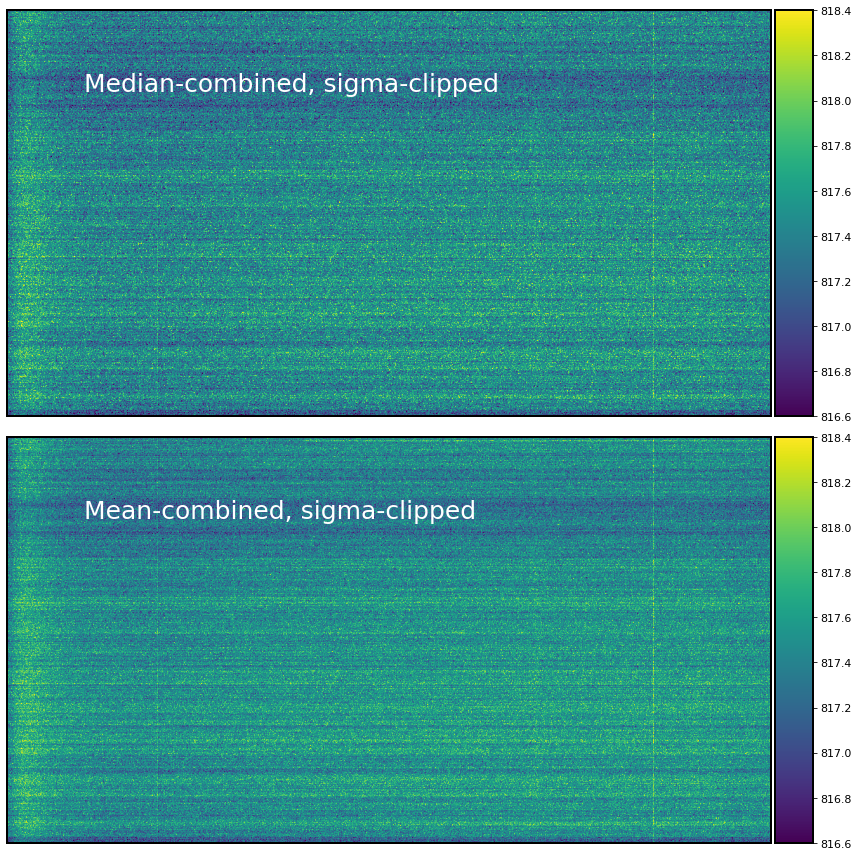

In [9]:
fig, [ax1, ax2] = plt.subplots(2, 1, figsize=(12, 12))

ax1 = show_image(med_bias_clipped, ax=ax1, fig=fig, vmin=816.6, vmax=818.4)
ax1.text(0.1, 0.8, 'Median-combined, sigma-clipped', fontsize=25, color='w', 
         ha='left', transform=ax1.transAxes)

ax2 = show_image(mean_bias_clipped, ax=ax2, fig=fig, vmin=816.6, vmax=818.4)
ax2.text(0.1, 0.8, 'Mean-combined, sigma-clipped', fontsize=25, color='w', 
         ha='left', transform=ax2.transAxes)

plt.tight_layout()

Yeah! After sigma-clipping, the mean-combined image looks much better and very similar to the median-combined one. This sigma-clipping trick is quite common in astronomy. We used a threshold of 3-sigma and only clipped once. You can repeat the procedure for several times to make sure all outliers are flagged. Actually, `astropy` already provides us a function `sigma_clip` to do these jobs. Let's check it out.

In [31]:
from astropy.stats import sigma_clip

In [32]:
astropy_clipped = sigma_clip(biases,  # the bias frames before sigma-clipping
                             sigma=3,  # threshould is 3-sigma
                             maxiters=5,  # do clipping for 5 times at most
                             cenfunc='median', stdfunc='std',
                             # use median and standard deviation to calculate clipping criterion
                             axis=(1, 2), # calc median and std for each bias frame
                             masked=False)

In [33]:
# might be slow
med_bias_apy = np.nanmedian(astropy_clipped, axis=0)
mean_bias_apy = np.nanmean(astropy_clipped, axis=0)

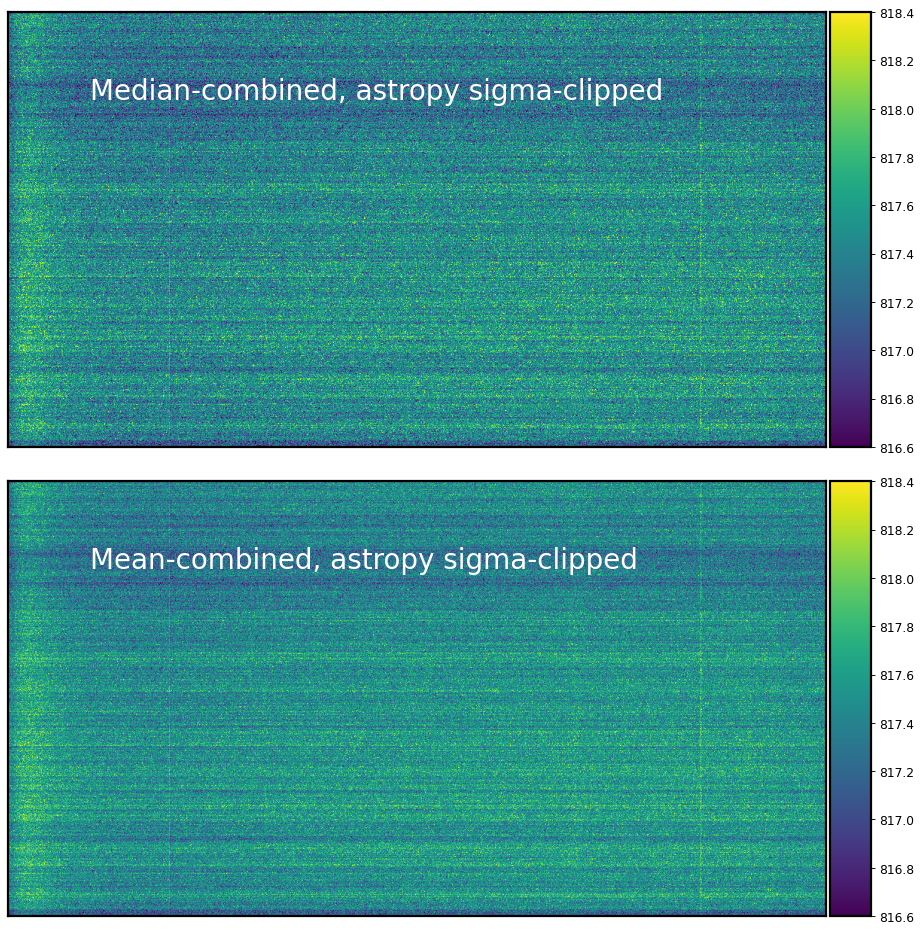

In [34]:
fig, [ax1, ax2] = plt.subplots(2, 1, figsize=(12, 12))

ax1 = show_image(med_bias_apy, ax=ax1, fig=fig, vmin=816.6, vmax=818.4)
ax1.text(0.1, 0.8, 'Median-combined, astropy sigma-clipped', fontsize=25, color='w', 
         ha='left', transform=ax1.transAxes)

ax2 = show_image(mean_bias_apy, ax=ax2, fig=fig, vmin=816.6, vmax=818.4)
ax2.text(0.1, 0.8, 'Mean-combined, astropy sigma-clipped', fontsize=25, color='w', 
         ha='left', transform=ax2.transAxes)

plt.tight_layout()

We can write the median-combined image to a FITS file for future usage. 

In [13]:
hdu = fits.PrimaryHDU(med_bias_clipped.astype(np.float32))
hdulist = fits.HDUList([hdu])
hdulist.writeto('./bias/master_bias.fits', overwrite=True)

# 2. Dark frame

Just to give you a flavor of dark frame, here we show the five dark frames that we took during the Magellan observation. They are full of cosmic rays. We construct a master dark frame by combining them using median.

In [53]:
darks = [fits.open(f'./dark/b{ind}c1.fits')[0].data for ind in range(1212, 1217)]
darks = np.array(darks)
med_dark = np.median(darks, axis=0)

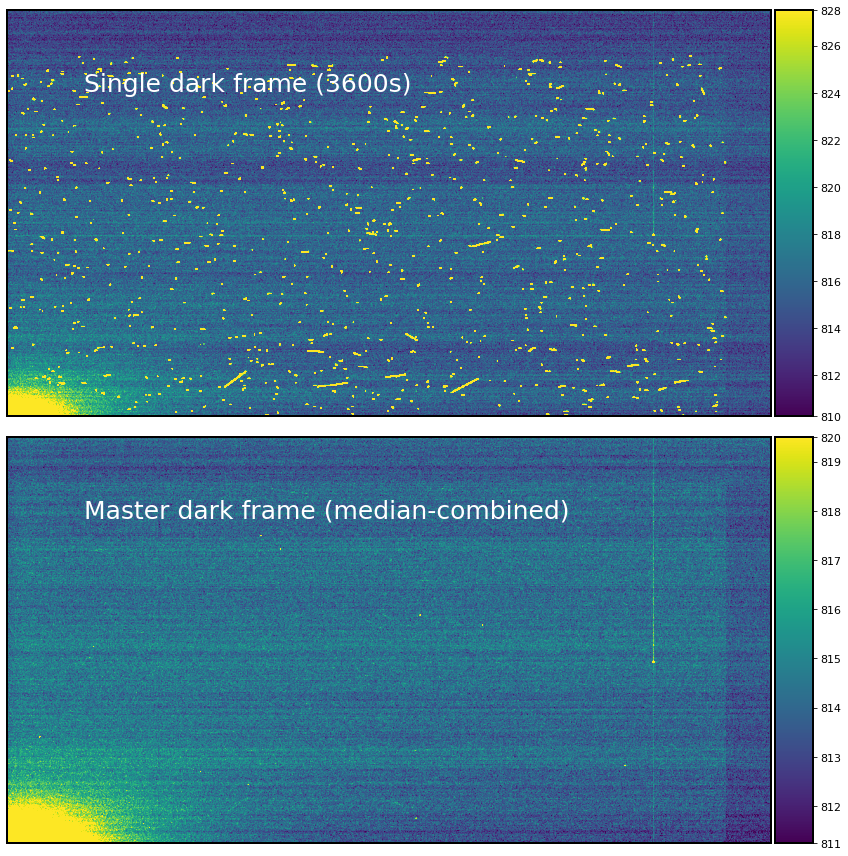

In [55]:
fig, [ax1, ax2] = plt.subplots(2, 1, figsize=(12, 12))

ax1 = show_image(darks[0], ax=ax1, fig=fig)
ax1.text(0.1, 0.8, 'Single dark frame (3600s)', fontsize=25, color='w', 
         ha='left', transform=ax1.transAxes)

ax2 = show_image(med_dark, ax=ax2, fig=fig)
ax2.text(0.1, 0.8, 'Master dark frame (median-combined)', fontsize=25, color='w', 
         ha='left', transform=ax2.transAxes)

plt.tight_layout()

The light area in the lower left corner is due to sensor glow, which is light emitted by the electronics of the CCD. The counts in a dark frame scales linearly with time. The exposure time for a dark frame is typically similar to (or longer than) the exposure time of your science frames. 

# 3. Flat fielding